In [2]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import io

In [3]:
# Reading the Crime csv file
df = pd.read_csv(r'C:\Users\hp\Downloads\Crime.csv')

C:\Users\hp\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (1,18) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
df.head(2)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
0,201219928,1204,180063894,12/21/2018 09:13:13 PM,120,1,Crime Against Property,Robbery,ROBBERY - STREET-GUN,WHEATON,...,NaN,GEORGIA,NaN,AVE,12/21/2018 09:13:00 PM,NaN,39.03627,-77.0499,4D,"(39.0363, -77.0499)"
1,201301798,5016,200035833,09/13/2020 12:26:58 AM,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,NaN,COLTRANE,NaN,DR,08/08/2020 05:10:00 PM,08/08/2020 12:00:00 AM,39.27784,-77.2115,5D,"(39.2778, -77.2115)"


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306094 entries, 0 to 306093
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident ID             306094 non-null  int64  
 1   Offence Code            306094 non-null  object 
 2   CR Number               306094 non-null  int64  
 3   Dispatch Date / Time    257065 non-null  object 
 4   NIBRS Code              306094 non-null  object 
 5   Victims                 306094 non-null  int64  
 6   Crime Name1             305822 non-null  object 
 7   Crime Name2             305822 non-null  object 
 8   Crime Name3             305822 non-null  object 
 9   Police District Name    306000 non-null  object 
 10  Block Address           279888 non-null  object 
 11  City                    304818 non-null  object 
 12  State                   306094 non-null  object 
 13  Zip Code                302915 non-null  float64
 14  Agency              

In [6]:
df.columns

Index(['Incident ID', 'Offence Code', 'CR Number', 'Dispatch Date / Time',
       'NIBRS Code', 'Victims', 'Crime Name1', 'Crime Name2', 'Crime Name3',
       'Police District Name', 'Block Address', 'City', 'State', 'Zip Code',
       'Agency', 'Place', 'Sector', 'Beat', 'PRA', 'Address Number',
       'Street Prefix', 'Street Name', 'Street Suffix', 'Street Type',
       'Start_Date_Time', 'End_Date_Time', 'Latitude', 'Longitude',
       'Police District Number', 'Location'],
      dtype='object')

In [7]:
# renaming some of the column names that are significant in the analysis
df = df.rename(columns={'Incident ID': 'Incident_ID', 'Offence Code': 'Offence_Code', 'CR Number': 'CR_Number', 'Dispatch Date / Time': 'Dispatch_Date / Time','NIBRS Code': 'NIBRS_Code', 'Crime Name1': 'Crime_Name1', 'Crime Name2': 'Crime_Name2', 'Crime Name3': 'Crime_Name3','Police District Name': 'Police_District_Name', 'Block Address': 'Block_Address', 'Zip Code': 'Zip_Code', 'Address Number': 'Address_Number','Street Prefix': 'Street_Prefix', 'Street Name': 'Street_Name', 'Street Suffix': 'Street_Suffix', 'Street Type': 'Street_Type','Police District Number': 'Police_District_Number'})

In [8]:
df.columns

Index(['Incident_ID', 'Offence_Code', 'CR_Number', 'Dispatch_Date / Time',
       'NIBRS_Code', 'Victims', 'Crime_Name1', 'Crime_Name2', 'Crime_Name3',
       'Police_District_Name', 'Block_Address', 'City', 'State', 'Zip_Code',
       'Agency', 'Place', 'Sector', 'Beat', 'PRA', 'Address_Number',
       'Street_Prefix', 'Street_Name', 'Street_Suffix', 'Street_Type',
       'Start_Date_Time', 'End_Date_Time', 'Latitude', 'Longitude',
       'Police_District_Number', 'Location'],
      dtype='object')

## Handling the missing values

From our observations the dataset consist of a number of missing values for each column. We need to have a critical 
look at these missing values for each of the columns to enable us decide on whether to keep, remove or replace 
it as this can bias the result or reduce the accuracy of our findings.

In [9]:
#print out the sum count of columns with missing values in our dataframe
df.isnull().sum()

Incident_ID                    0
Offence_Code                   0
CR_Number                      0
Dispatch_Date / Time       49029
NIBRS_Code                     0
Victims                        0
Crime_Name1                  272
Crime_Name2                  272
Crime_Name3                  272
Police_District_Name          94
Block_Address              26206
City                        1276
State                          0
Zip_Code                    3179
Agency                         0
Place                          0
Sector                      1530
Beat                        1530
PRA                          239
Address_Number             26109
Street_Prefix             292463
Street_Name                    1
Street_Suffix             300662
Street_Type                  339
Start_Date_Time                0
End_Date_Time             161658
Latitude                       0
Longitude                      0
Police_District_Number         0
Location                       0
dtype: int

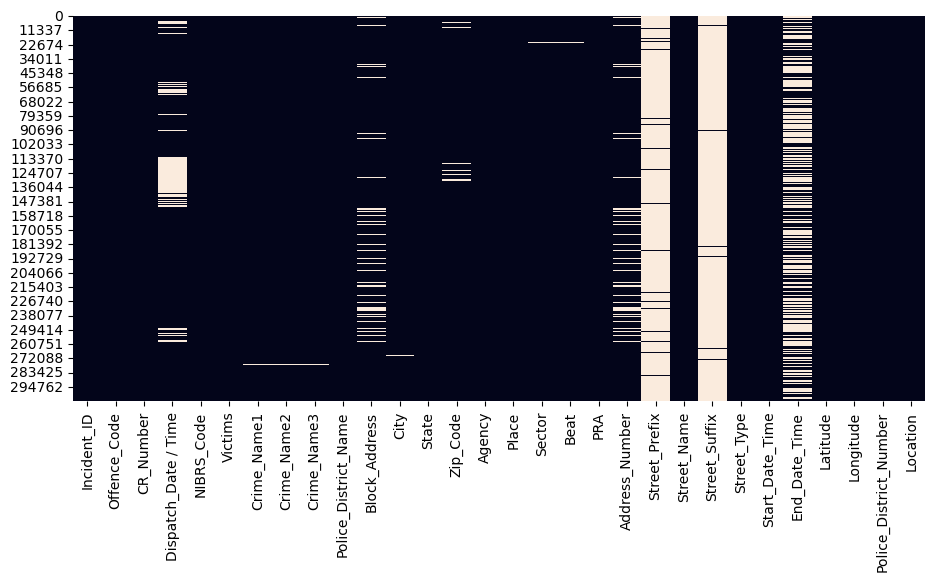

In [10]:
plt.figure(figsize=(11,5)) #setting out plot size with figsize
sns.heatmap(df.isnull(),cbar=False);# Ploting a Heatmap of the missing value for each column

- From above heatmap shows, columns like "Street Prefix,Street Suffix and End_Date_Time" can be dropped since they have lots of missing values and are non critical in answering our research questions. 
- However, there are alot of missing values in a different format ("NAN")
- Since all columns with missing values are in a categorical form, we will also drop the missing values containing NAN.

In [11]:
#dropping columns with most missing values using the 'df.drop' function and a list of the columns to be dropped.
df.drop([ 'Street_Prefix','Street_Suffix','End_Date_Time'],inplace= True,axis=1)
# dropping NaN values from the data set using the method 'dropna'.
df.dropna(inplace= True)

In [12]:
# Rechecking for sum count of missing values after dropping missing values and Nan using below code.
df.isnull().sum()

Incident_ID               0
Offence_Code              0
CR_Number                 0
Dispatch_Date / Time      0
NIBRS_Code                0
Victims                   0
Crime_Name1               0
Crime_Name2               0
Crime_Name3               0
Police_District_Name      0
Block_Address             0
City                      0
State                     0
Zip_Code                  0
Agency                    0
Place                     0
Sector                    0
Beat                      0
PRA                       0
Address_Number            0
Street_Name               0
Street_Type               0
Start_Date_Time           0
Latitude                  0
Longitude                 0
Police_District_Number    0
Location                  0
dtype: int64

In [13]:
#Summary of our current dataframe after cleaning using the function 'info()'.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 229282 entries, 0 to 306093
Data columns (total 27 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident_ID             229282 non-null  int64  
 1   Offence_Code            229282 non-null  object 
 2   CR_Number               229282 non-null  int64  
 3   Dispatch_Date / Time    229282 non-null  object 
 4   NIBRS_Code              229282 non-null  object 
 5   Victims                 229282 non-null  int64  
 6   Crime_Name1             229282 non-null  object 
 7   Crime_Name2             229282 non-null  object 
 8   Crime_Name3             229282 non-null  object 
 9   Police_District_Name    229282 non-null  object 
 10  Block_Address           229282 non-null  object 
 11  City                    229282 non-null  object 
 12  State                   229282 non-null  object 
 13  Zip_Code                229282 non-null  float64
 14  Agency              

After data cleaning, there were 22,9282 entries left. Before we start answering our research questions using visualization, we need to transform the feature start_date_time to date and time objects as this is critical to our research questions.

In [14]:
# Split Date Column into date time object
date = pd.to_datetime(df["Start_Date_Time"]) # transform column start date column to a date
disp_date = pd.to_datetime(df["Dispatch_Date / Time"]) # transform column start date column to a date
disp_hour = disp_date.dt.hour
month =  date.dt.month
day = date.dt.day_name()
year = date.dt.year
hour = date.dt.hour

# add new columns to the dataframe 
df['Dispatch_Time']= disp_hour
df['Start_date_Hour'] = hour
df['Start_date_Weekday'] = day
df['Start_date_Month'] = month
df['Start_date_Year'] = year
df['Start_Date'] = date
df = df.sort_values(by='Start_Date')

Crital to answering our research questions we added an new feature as part of our columns called "crime_count". This is to enable as determine relationships between the crime counts as each row of our dataframe represent a crime, to the other features in the columns.

In [15]:
# adding a new column 'crime_count' with value '1' representing crime count for each row.
df['crime_count'] = 1

In [16]:
# Summary of our current dataframe after transforming 'Start_Date_Time' and adding new colums date, hour, weekday, month, year and crime_count.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 229282 entries, 151883 to 109962
Data columns (total 34 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Incident_ID             229282 non-null  int64         
 1   Offence_Code            229282 non-null  object        
 2   CR_Number               229282 non-null  int64         
 3   Dispatch_Date / Time    229282 non-null  object        
 4   NIBRS_Code              229282 non-null  object        
 5   Victims                 229282 non-null  int64         
 6   Crime_Name1             229282 non-null  object        
 7   Crime_Name2             229282 non-null  object        
 8   Crime_Name3             229282 non-null  object        
 9   Police_District_Name    229282 non-null  object        
 10  Block_Address           229282 non-null  object        
 11  City                    229282 non-null  object        
 12  State                   2

#### FREQUENCY COUNTS

To get the frequency counts, the value_counts() function used will count the number of occurences of each column in the given dataset as showned below.

In [19]:
# The function to_frame was used to convert to dataframe
df.NIBRS_Code.value_counts().to_frame()

,NIBRS_Code
90Z,59890
23F,21201
13B,17140
290,15132
23C,13706
23H,11285
35A,10434
23D,9357
26F,8288
220,7185


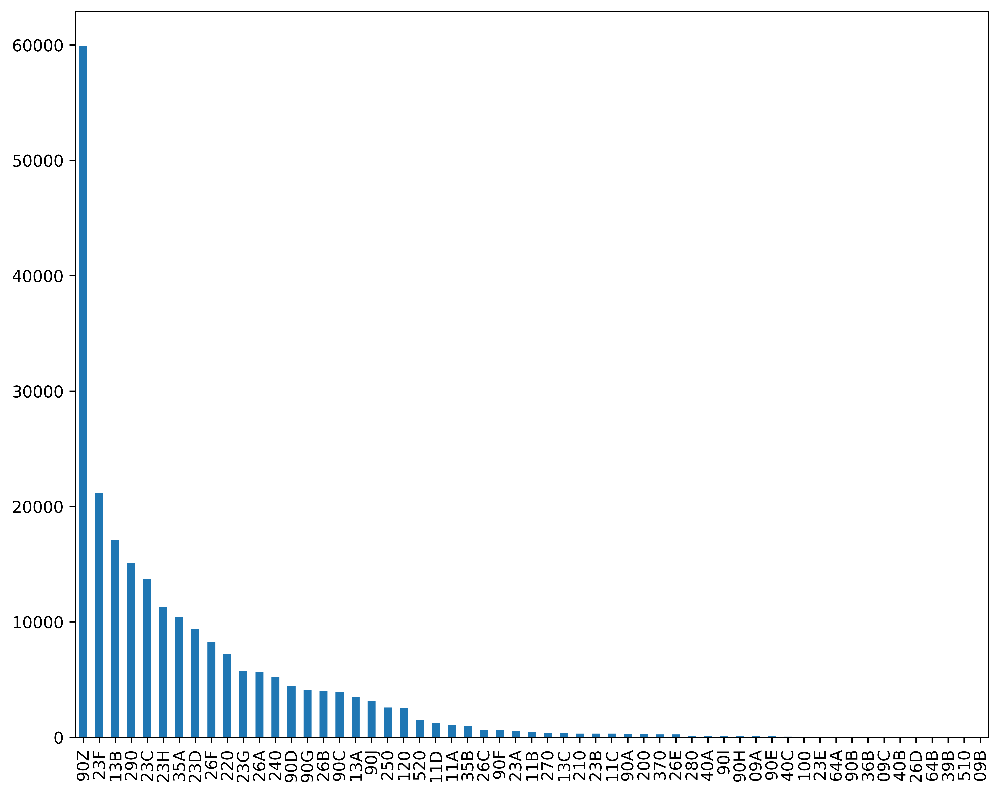

In [20]:
plt.figure(figsize=(10,8), dpi=900)
df.NIBRS_Code.value_counts().plot.bar();

In [21]:
df.Victims.value_counts().to_frame()

,Victims
1,224656
2,3941
3,467
4,148
5,42
6,12
7,10
8,4
12,2


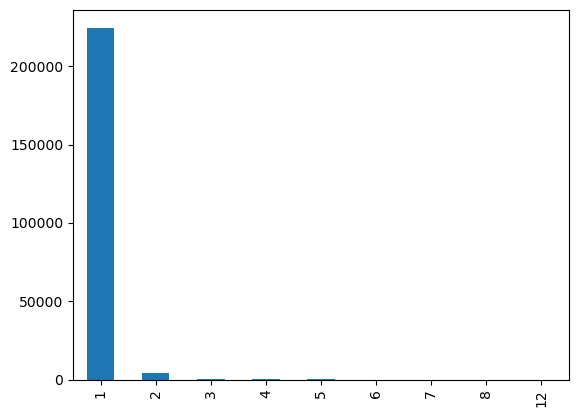

In [22]:
df.Victims.value_counts().plot.bar();

In [23]:
df.Crime_Name1.value_counts().to_frame()

,Crime_Name1
Crime Against Property,115084
Other,50843
Crime Against Society,35934
Crime Against Person,24424
Not a Crime,2997


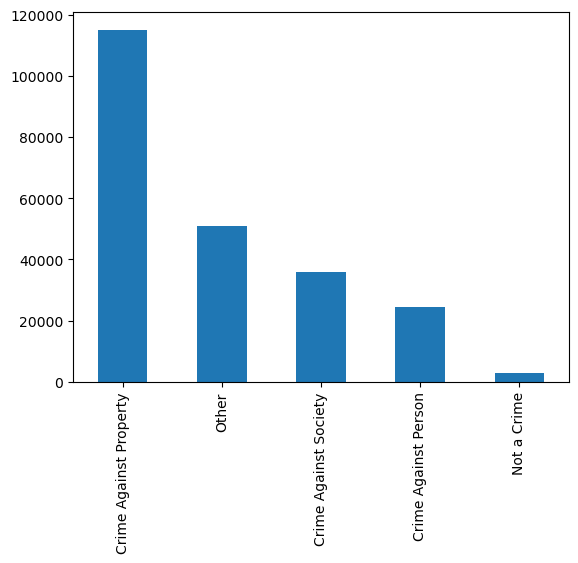

In [24]:
df.Crime_Name1.value_counts().plot.bar();

In [29]:
df.Offence_Code.value_counts().to_frame()

,Offence_Code
2305,17899
9199,12175
1399,11596
2303,11049
9113,9745
...,...
5801,1
3610,1
3805,1
2306,1


In [30]:
plt.figure(figsize=(60,20), dpi=600)
df.Offence_Code.value_counts().plot.bar();

In [31]:
df.Police_District_Name.value_counts().to_frame()

,Police_District_Name
SILVER SPRING,47287
WHEATON,43027
MONTGOMERY VILLAGE,38930
BETHESDA,33820
ROCKVILLE,31697
GERMANTOWN,30125
CITY OF TAKOMA PARK,4396


In [32]:
plt.figure(figsize=(20,10), dpi=600)
df.Police_District_Name.value_counts().plot.bar();

#### DESCRIPTIVE/SUMMARY STATISTICS

To get the mean of the given dataset, the function df.describe() was used. This function displays othere descriptive statistics too. As can be seen in the figure below, it displays the standard deviation, maximum,minimum, quartile and range for the dataset.

The median, mode and variance were obtained using the median(), mode() and var() functions respectively.

In [33]:
# Columns that are object or contains string
df.describe(include=['object'])

,Offence_Code,Dispatch_Date / Time,NIBRS_Code,Crime_Name1,Crime_Name2,Crime_Name3,Police_District_Name,Block_Address,City,State,...,Place,Sector,Beat,PRA,Street_Name,Street_Type,Start_Date_Time,Police_District_Number,Location,Start_date_Weekday
count,229282,229282,229282,229282,229282,229282,229282,229282,229282,229282,...,229282,229282,229282,229282.0,229282,229282,229282,229282,229282,229282
unique,577,210691,57,5,59,328,7,20262,43,6,...,99,15,54,1536.0,7486,30,167672,7,30244,7
top,2305,12/02/2019 04:39:39 PM,90Z,Crime Against Property,All Other Offenses,LARCENY - FROM AUTO,SILVER SPRING,11100 BLK VEIRS MILL RD,SILVER SPRING,MD,...,Residence - Single Family,A,3G1,702.0,GEORGIA,RD,11/30/2019 12:00:00 PM,3D,"(0.0, 0.0)",Friday
freq,17899,48,59890,115084,57528,21201,47287,3370,78225,229248,...,26949,22580,14632,3096.0,9148,55500,43,47287,3231,35644


In [34]:
#mode
df.iloc[0:,1:].mode().transpose()

,0
Offence_Code,2305
CR_Number,170550978
Dispatch_Date / Time,12/02/2019 04:39:39 PM
NIBRS_Code,90Z
Victims,1
Crime_Name1,Crime Against Property
Crime_Name2,All Other Offenses
Crime_Name3,LARCENY - FROM AUTO
Police_District_Name,SILVER SPRING
Block_Address,11100 BLK VEIRS MILL RD


In [36]:
df.median()

/var/folders/rq/jpyrm19172xcfsvt54lhpynm0000gn/T/ipykernel_57880/530051474.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df.median()
/var/folders/rq/jpyrm19172xcfsvt54lhpynm0000gn/T/ipykernel_57880/530051474.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.median()


Incident_ID         2.012579e+08
CR_Number           1.900454e+08
Victims             1.000000e+00
Zip_Code            2.087700e+04
Address_Number      8.200000e+03
Latitude            3.907552e+01
Longitude          -7.710580e+01
Dispatch_Time       1.400000e+01
Start_date_Hour     1.400000e+01
Start_date_Month    6.000000e+00
Start_date_Year     2.019000e+03
crime_count         1.000000e+00
dtype: float64

In [37]:
# A table showcasing the Range, Quantiles, Standard Deviation, max, min and Mean
df1 = df.describe().T
df1['range'] = df1['max']-df1['min']
df1

,count,mean,std,min,25%,50%,75%,max,range
Incident_ID,229282.0,2.012581e+08,7.510932e+04,2.011280e+08,2.011929e+08,2.012579e+08,2.013228e+08,2.013872e+08,2.591940e+05
CR_Number,229282.0,1.933800e+08,1.592411e+07,1.705000e+08,1.800296e+08,1.900454e+08,2.100089e+08,2.200339e+08,4.953394e+07
Victims,229282.0,1.024673e+00,1.955920e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.200000e+01,1.100000e+01
Zip_Code,229282.0,2.087624e+04,3.385422e+01,2.000100e+04,2.085300e+04,2.087700e+04,2.090300e+04,2.179700e+04,1.796000e+03
Address_Number,229282.0,8.452092e+03,1.568108e+04,1.000000e+00,1.700000e+03,8.200000e+03,1.250000e+04,2.090600e+06,2.090599e+06
Latitude,229282.0,3.853132e+01,4.607141e+00,0.000000e+00,3.902208e+01,3.907552e+01,3.914281e+01,3.934214e+01,3.934214e+01
Longitude,229282.0,-7.602966e+01,9.090189e+00,-7.751675e+01,-7.719805e+01,-7.710580e+01,-7.703220e+01,0.000000e+00,7.751675e+01
Dispatch_Time,229282.0,1.359048e+01,5.690658e+00,0.000000e+00,1.000000e+01,1.400000e+01,1.800000e+01,2.300000e+01,2.300000e+01
Start_date_Hour,229282.0,1.333597e+01,6.575186e+00,0.000000e+00,9.000000e+00,1.400000e+01,1.900000e+01,2.300000e+01,2.300000e+01
Start_date_Month,229282.0,6.472335e+00,3.335906e+00,1.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,1.200000e+01,1.100000e+01


In [38]:
df.var()

/var/folders/rq/jpyrm19172xcfsvt54lhpynm0000gn/T/ipykernel_57880/1568254755.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.var()


Incident_ID         5.641410e+09
CR_Number           2.535771e+14
Victims             3.825623e-02
Zip_Code            1.146108e+03
Address_Number      2.458964e+08
Latitude            2.122575e+01
Longitude           8.263153e+01
Dispatch_Time       3.238359e+01
Start_date_Hour     4.323307e+01
Start_date_Month    1.112827e+01
Start_date_Year     2.567849e+00
crime_count         0.000000e+00
dtype: float64

#### NORMALITY (FREQUENCY HISTOGRAMS)

Text(0, 0.5, 'Frequency')

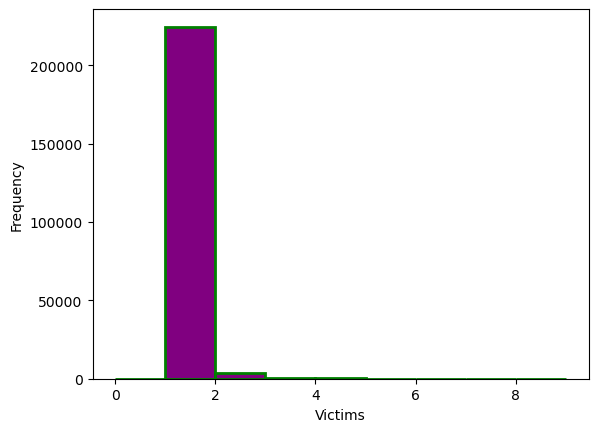

In [40]:
plt.hist(df['Victims'], bins=range(0,10,1), color='purple', edgecolor='green',lw=2)
plt.xlabel('Victims')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

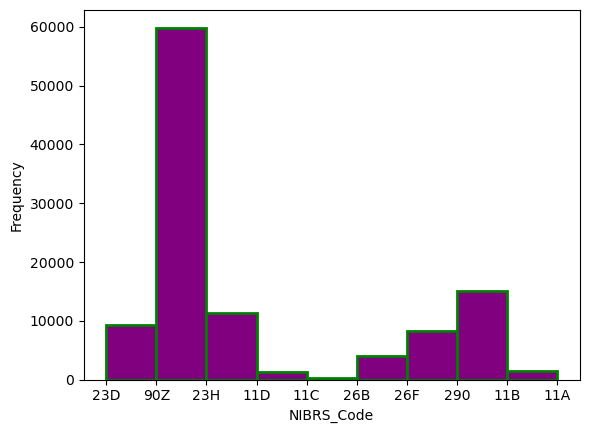

In [41]:
plt.hist(df['NIBRS_Code'], bins=range(0,10,1), color='purple', edgecolor='green',lw=2)
plt.xlabel('NIBRS_Code')
plt.ylabel('Frequency')

#### QUALITY OF MEASUREMENT

''' Taking measurements of data quality will help us identify errors by identifying factors such as accuracy, completeness, consistency, reliability, and whether the data is up to date. Based on the datasets given, some missing values were found. '''

**DATA TRANSFORMATION: transpose, data sorting** 

'''
**Transpose:** 
The transpose() function was used in getting the mode of the data sets to transpose index and columns, Reflecting the DataFrame over its main diagonal by writing rows as columns and vice-versa. Also, the to_dataframe() was used to convert interested columns to a dataframe for basic visualization.


**Data Sorting**: Data Sorting: It is the process that will help arrange the dataset into meaningful order for data analyzation to be more clear and effective, the sort function was used when the date column was transformed.
'''

**BASIC PLOTS**

The basic plots shown below provides the basic framework for visualizing our datasets.

(a) Scatter plot shows and observe the relationships between two variables(victims & place).

(b) The Histogram shows the frequency distribution of (victims column) in this dataset.

(c) Line plot here displays the progression of the variable(NIBRS_Code).

(d) Pie chart typically shows proportions of each categories in (Crime_Name1) in the dataset.

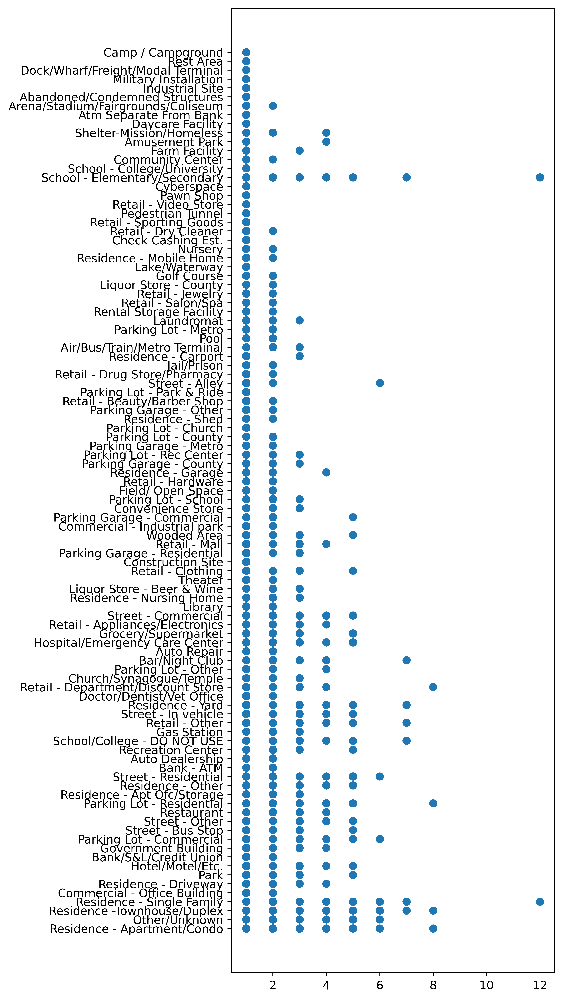

In [42]:
#BASIC PLOTS FOR DATA
#SCATTER PLOT
plt.figure(figsize=(5,15), dpi=600)
plt.scatter(x=df.Victims, y=df.Place);

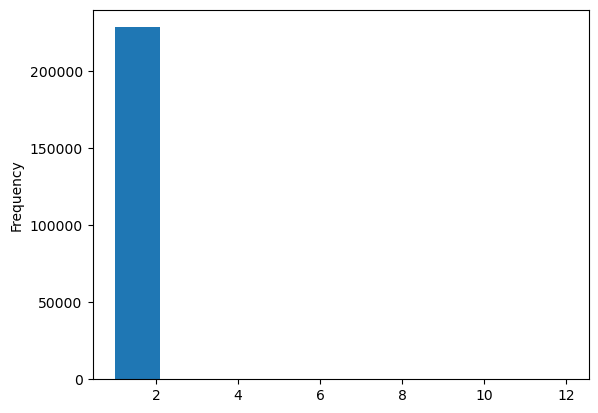

In [43]:
#Histogram
df.Victims.plot.hist();

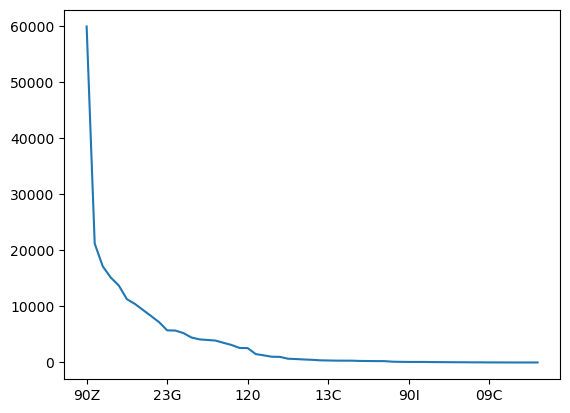

In [44]:
#line PLOT
df.NIBRS_Code.value_counts().plot.line();

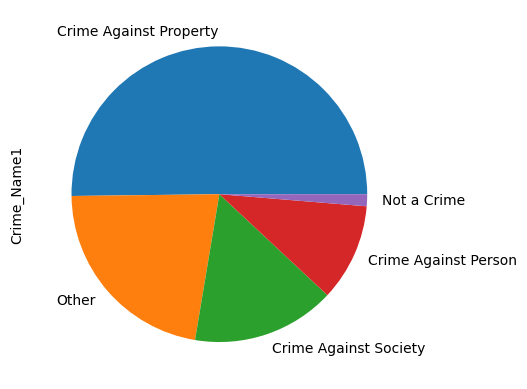

In [45]:
#PIECHAART
df.Crime_Name1.value_counts().plot.pie();

**CORRELATION ANALYSIS**

Correlation analysis is neccesary for finding the pairwise correlation of all columns in the dataframe.
Any N/A values are automatically excluded. For any non-numeric data type columns in the dataframe it is ignored.

In [46]:
df.corr()

,Incident_ID,CR_Number,Victims,Zip_Code,Address_Number,Latitude,Longitude,Dispatch_Time,Start_date_Hour,Start_date_Month,Start_date_Year,crime_count
Incident_ID,1.000000,0.983205,0.012777,-0.028815,-0.000168,-0.149369,0.149305,-0.017647,-0.042695,-0.049149,0.978027,NaN
CR_Number,0.983205,1.000000,0.012393,-0.028606,-0.000315,-0.150994,0.150927,-0.015920,-0.044437,-0.208823,0.992631,NaN
Victims,0.012777,0.012393,1.000000,0.012288,0.002591,0.001077,-0.000855,0.000626,0.001382,0.001136,0.013529,NaN
Zip_Code,-0.028815,-0.028606,0.012288,1.000000,0.001839,0.038665,-0.035340,0.004614,0.020986,-0.003343,-0.026108,NaN
Address_Number,-0.000168,-0.000315,0.002591,0.001839,1.000000,-0.054622,0.056030,0.005626,0.001468,0.003066,-0.000262,NaN
Latitude,-0.149369,-0.150994,0.001077,0.038665,-0.054622,1.000000,-0.999937,0.002576,0.008250,0.000359,-0.149001,NaN
Longitude,0.149305,0.150927,-0.000855,-0.035340,0.056030,-0.999937,1.000000,-0.002652,-0.008282,-0.000348,0.148934,NaN
Dispatch_Time,-0.017647,-0.015920,0.000626,0.004614,0.005626,0.002576,-0.002652,1.000000,0.598758,-0.008660,-0.015506,NaN
Start_date_Hour,-0.042695,-0.044437,0.001382,0.020986,0.001468,0.008250,-0.008282,0.598758,1.000000,0.009553,-0.033293,NaN
Start_date_Month,-0.049149,-0.208823,0.001136,-0.003343,0.003066,0.000359,-0.000348,-0.008660,0.009553,1.000000,-0.221679,NaN


**Correlation structures, distribution characteristics **

/Users/macquaisie/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


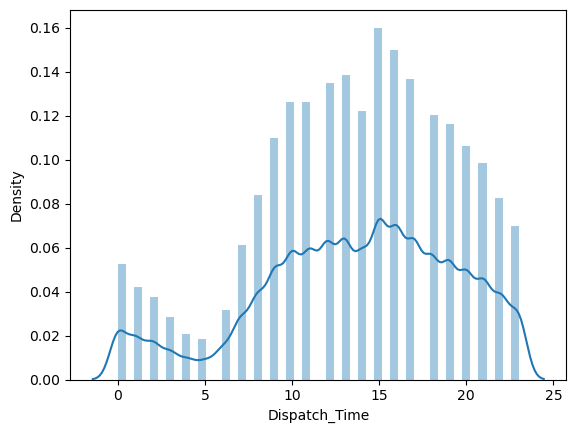

In [47]:
# Distribution characteristics
sns.distplot(df.Dispatch_Time);

**TRENDS IN DATA**

Trends can be shown using various form of data visualization tools, but in this case in this case a scatter plot is used to show the relationship between two columns(Victims, Place) in the dataset.

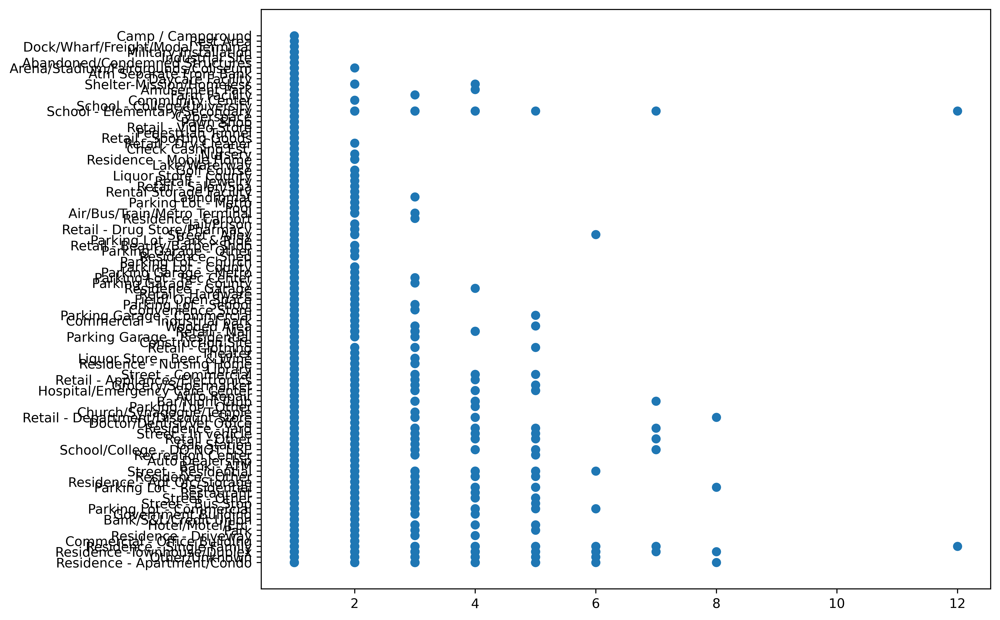

In [48]:
plt.figure(figsize=(10,8), dpi=600)
plt.scatter(x=df.Victims, y=df.Place);

### RESEARCH QUESTIONS

#### Question1:Is there a relationship between the number of victims and crimes within Montgomery County in the state of Maryland?

In [49]:
#Using Start_Date_Time time identify days of week
start_time = pd.to_datetime(df["Start_Date_Time"])
year         = (start_time.dt.year)
print(year)

151883    2016
87004     2016
150414    2016
230194    2016
26794     2016
          ... 
109957    2022
109958    2022
109961    2022
109963    2022
109962    2022
Name: Start_Date_Time, Length: 229282, dtype: int64


In [50]:
df.sort_index(inplace=True)
df.head()

,Incident_ID,Offence_Code,CR_Number,Dispatch_Date / Time,NIBRS_Code,Victims,Crime_Name1,Crime_Name2,Crime_Name3,Police_District_Name,...,Longitude,Police_District_Number,Location,Dispatch_Time,Start_date_Hour,Start_date_Weekday,Start_date_Month,Start_date_Year,Start_Date,crime_count
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,-77.265619,5D,"(39.1777, -77.2656)",21,21,Thursday,8,2018,2018-08-23 21:52:00,1
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,-77.097063,2D,"(38.9927, -77.0971)",1,1,Friday,3,2018,2018-03-30 01:01:00,1
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,-77.097063,2D,"(38.9927, -77.0971)",1,1,Friday,3,2018,2018-03-30 01:01:00,1
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,-77.218189,6D,"(39.148, -77.2182)",22,22,Thursday,6,2018,2018-06-14 22:26:00,1
4,201204355,2204,180043926,09/03/2018 12:06:54 PM,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,-77.096561,2D,"(38.9662, -77.0966)",12,23,Sunday,9,2018,2018-09-02 23:30:00,1


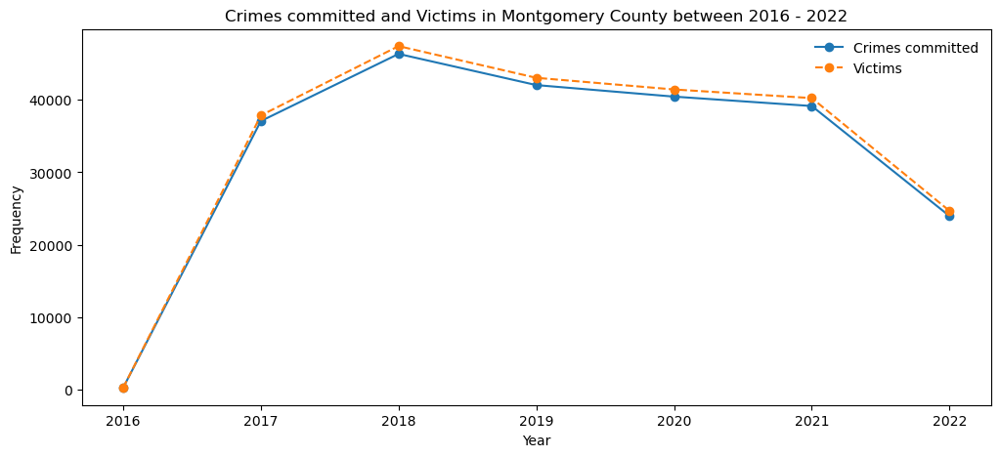

In [51]:
# crime yearly trend line
# victims yearly trend line

# using a query to get the crime and victims total
yearly = df.groupby(df['Start_date_Year'])[['crime_count', 'Victims']].sum()
# plot the figure
yearly.plot(style=['-o', '--o'], figsize=(12, 5))
# set the figure
plt.title('Crimes committed and Victims in Montgomery County between 2016 - 2022')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(['Crimes committed', 'Victims'], frameon=False);

In [52]:
year.unique

<bound method Series.unique of 151883    2016
87004     2016
150414    2016
230194    2016
26794     2016
          ... 
109957    2022
109958    2022
109961    2022
109963    2022
109962    2022
Name: Start_Date_Time, Length: 229282, dtype: int64>

#### Question2: What is the distribution of crime in Montgomery County in the state of Maryland?

In [53]:
df['Start_date_Year'].value_counts()

2018    46342
2019    42039
2020    40448
2021    39150
2017    37073
2022    23968
2016      262
Name: Start_date_Year, dtype: int64

<Figure size 10800x7200 with 0 Axes>

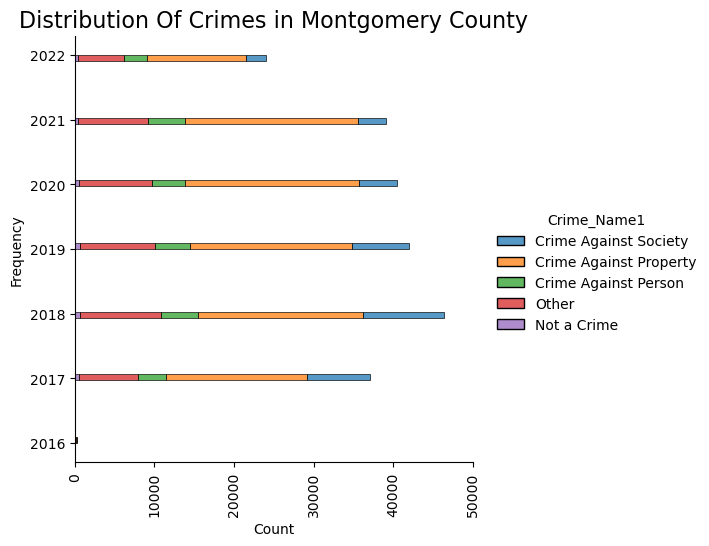

In [54]:
plt.figure(figsize=(12,8), dpi=900)
stackbar1= sns.displot(data=df, y='Start_date_Year', hue='Crime_Name1', multiple='stack')
stackbar1.set_xticklabels(rotation=90)
stackbar1.set(ylabel='Frequency')
plt.title("Distribution Of Crimes in Montgomery County",fontsize= 16);

#### Question 3: What is the distribution of crime across police district in Montgomery County in the state of Maryland?

In [55]:
df['Police_District_Name'].unique()

array(['GERMANTOWN', 'BETHESDA', 'MONTGOMERY VILLAGE', 'ROCKVILLE',
       'SILVER SPRING', 'WHEATON', 'CITY OF TAKOMA PARK'], dtype=object)

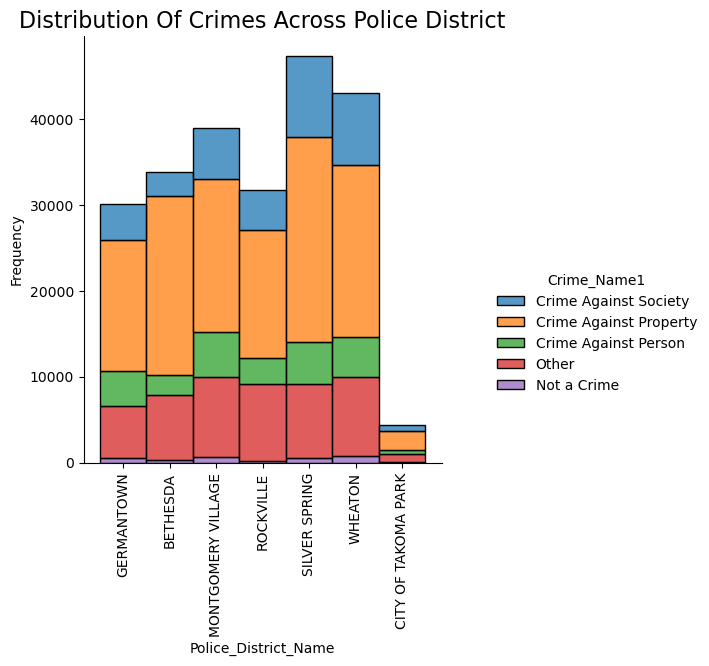

In [56]:
stackbar= sns.displot(data=df, x='Police_District_Name', hue='Crime_Name1', multiple='stack');
stackbar.set_xticklabels(rotation=90);
stackbar.set(ylabel='Frequency');
plt.title("Distribution Of Crimes Across Police District",fontsize= 16);

#### Question 4: Which city in Montgomery County in the state of Maryland is dominant in terms of crime committed?

In [57]:
df['City'].unique()

array(['GERMANTOWN', 'BETHESDA', 'GAITHERSBURG', 'CHEVY CHASE',
       'ROCKVILLE', 'SILVER SPRING', 'TAKOMA PARK', 'POTOMAC',
       'BURTONSVILLE', 'OLNEY', 'GLEN ECHO', 'KENSINGTON', 'BOYDS',
       'ASHTON', 'CLARKSBURG', 'MONTGOMERY VILLAGE', 'DAMASCUS',
       'DERWOOD', 'BEALLSVILLE', 'SANDY SPRING', 'DICKERSON',
       'POOLESVILLE', 'WASHINGTON GROVE', 'BROOKEVILLE', 'CABIN JOHN',
       'MT AIRY', 'GARRETT PARK', 'SPENCERVILLE', 'BRINKLOW',
       'BARNESVILLE', 'LAUREL', 'MOUNT AIRY', 'BELTSVILLE',
       'NORTH POTOMAC', 'LANHAM', 'WASHINGTON', 'HIGHLAND', 'ADELPHI',
       'HAGERSTOWN', 'WOODBINE', 'FREDERICK', 'BOWIE', 'GREENBELT'],
      dtype=object)

In [58]:
len(df['City'].unique())

43

In [59]:
df['City'].value_counts()

SILVER SPRING         78225
ROCKVILLE             32923
GAITHERSBURG          32445
GERMANTOWN            22854
BETHESDA              16827
MONTGOMERY VILLAGE     7083
TAKOMA PARK            5437
POTOMAC                5085
CHEVY CHASE            4979
DERWOOD                4271
KENSINGTON             3692
OLNEY                  3585
BURTONSVILLE           2806
CLARKSBURG             2604
DAMASCUS               1933
BOYDS                  1607
BROOKEVILLE             730
POOLESVILLE             701
SANDY SPRING            327
ASHTON                  278
DICKERSON               240
CABIN JOHN              176
SPENCERVILLE            111
GLEN ECHO                71
BRINKLOW                 58
MOUNT AIRY               48
BEALLSVILLE              37
LAUREL                   36
BARNESVILLE              30
MT AIRY                  17
GARRETT PARK             15
BELTSVILLE               12
HIGHLAND                  9
WASHINGTON GROVE          6
WASHINGTON                6
WOODBINE            

In [60]:
plt.figure(figsize=(12,8), dpi=900)
histp=sns.countplot(x='City', hue=year, data=df)
plt.legend(loc='center right', title='Year')
histp.set_xticklabels(histp.get_xticklabels(), rotation=90)
plt.title("Dominant City with most Crimes",fontsize= 16);

#### Question 5: Yearly crime counts across different crime scenes.

In [61]:
df2=df[['Start_date_Year','Place']];
df2['count']=1;
df2=df2.groupby(['Start_date_Year','Place'],as_index=False).sum();
df2

/var/folders/rq/jpyrm19172xcfsvt54lhpynm0000gn/T/ipykernel_57880/4126069314.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['count']=1;


,Start_date_Year,Place,count
0,2016,Auto Dealership,5
1,2016,Auto Repair,1
2,2016,Bank - ATM,3
3,2016,Bank/S&L/Credit Union,1
4,2016,Bar/Night Club,1
...,...,...,...
561,2022,Street - In vehicle,828
562,2022,Street - Other,310
563,2022,Street - Residential,1146
564,2022,Theater,18


In [62]:
Place_name=df2['Place'].unique().tolist()
fig=make_subplots(specs=[[{"secondary_y":False}]])
for locationi in Place_name:    
    df3=df2[df2['Place']==locationi]    #display(data2b)    
    fig.add_trace(go.Scatter(x=df3['Start_date_Year'],y=df3['count'],name=locationi),secondary_y=False,)
fig.update_layout(autosize=False,width=1000,height=1000,title_text="Yearly Change of Crimes")
fig.update_xaxes(title_text="Year")
fig.update_yaxes(title_text="crime_count",secondary_y=False)
fig.show();

#### Question 6: Is there a relationship between type of crime and the place of crime?

In [63]:
df.groupby(df['City'])[['Crime_Name1']].value_counts()

City              Crime_Name1           
ADELPHI           Other                       1
                  Crime Against Society       1
ASHTON            Crime Against Property    147
                  Other                      75
                  Crime Against Society      33
                                           ... 
WASHINGTON GROVE  Crime Against Property      3
                  Crime Against Society       2
                  Crime Against Person        1
WOODBINE          Crime Against Property      3
                  Other                       3
Length: 173, dtype: int64

In [64]:
plt.figure(figsize=(12,8), dpi=900)
histp=sns.countplot(x='City', hue='Crime_Name1', data=df, dodge = False)
plt.legend(loc='upper right', title='Crime_Name1')
histp.set_xticklabels(histp.get_xticklabels(), rotation=90)
plt.title("Relationship between type of crime and city",fontsize= 16);

#### Question 7: Is there a relationship between the days of the week and types of crime committed?

In [65]:
df.groupby(df['Start_date_Weekday'])[['Crime_Name1']].value_counts()

Start_date_Weekday  Crime_Name1           
Friday              Crime Against Property    17858
                    Other                      7777
                    Crime Against Society      5929
                    Crime Against Person       3569
                    Not a Crime                 511
Monday              Crime Against Property    17396
                    Other                      7587
                    Crime Against Society      4406
                    Crime Against Person       3310
                    Not a Crime                 459
Saturday            Crime Against Property    14917
                    Other                      6426
                    Crime Against Society      4691
                    Crime Against Person       3806
                    Not a Crime                 349
Sunday              Crime Against Property    13650
                    Other                      6057
                    Crime Against Society      4344
                    C

In [66]:
plt.figure(figsize=(12,8), dpi=900)
histp=sns.countplot(x='Start_date_Weekday', hue='Crime_Name1', data=df)
plt.legend( bbox_to_anchor=(1, 0.5), title='Crime_Name1')
histp.set_xticklabels(histp.get_xticklabels(), rotation=90)
plt.title("Relationship between the days of the week and types of crime",fontsize= 16);

#### Question 8: Is there a relationship between the days of the week and the number of crimes committed?

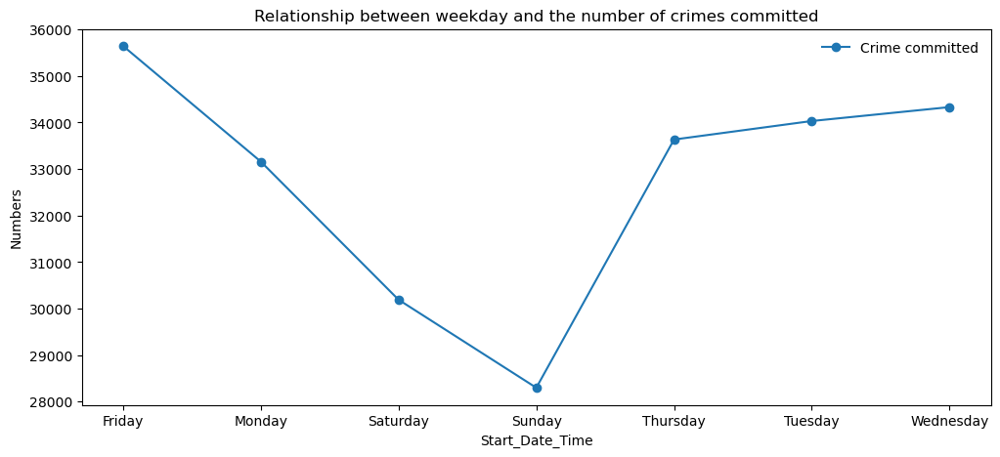

In [67]:
# sum of crime and victims for each dayofweek


weekday_c = df.groupby(date.dt.day_name())[['crime_count']].sum()
# set the index of each day of week
weekday_c.plot(style=['-o', '--o'], figsize=(12, 5))
plt.title('Relationship between weekday and the number of crimes committed')
plt.ylabel('Numbers')
plt.legend(['Crime committed'], frameon=False);